In [1]:
import numpy as np
import root_numpy as rnp
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'root_numpy'

In [2]:
def getPlot(string):
    arr = string.split(" ")
    return arr[0]

def getMin(string):
    arr = string.split(" ")
    if(len(arr) < 2): return -9999
    else: return float(arr[1])

def getMax(string):
    arr = string.split(" ")
    if(len(arr) < 3): return -9999
    else: return float(arr[2])
    
def scaleVar(scalar,minimum,maximum):
    scaleTo_min = 0.
    scaleTo_max = 1.
    return (scaleTo_max - scaleTo_min)/(maximum - minimum) * (scalar - minimum) + scaleTo_min

def scaleVarInv(scalar,minimum,maximum):
    scaleTo_min = 0.
    scaleTo_max = 1.
    return (scalar - scaleTo_min) * (maximum - minimum)/(scaleTo_max - scaleTo_min) + minimum

def scaleArr(array,minimum,maximum):
    for i in range(array.shape[1]):
        for j in range(array.shape[0]):
            array[j][i] = scaleVar(array[j][i],minimum[i],maximum[i])
    return array

def scaleArrInv(array,minimum,maximum):
    for i in range(array.shape[1]):
        for j in range(array.shape[0]):
            array[j][i] = scaleVarInv(array[j][i],minimum[i],maximum[i])
    return array

def shiftArr(array,shift):
    for i in range(array.shape[1]):
        for j in range(array.shape[0]):
            array[j][i] = array[j][i] + shift
    return array

In [17]:
uncVZi = 2
uncMi = 8
uncVZcut = -9999

param_names = []
param_names.append("uncVX -1 1")
param_names.append("uncVY -1 1")
param_names.append("uncVZ -8 70")
param_names.append("eleTrkZ0 -5 5")
param_names.append("posTrkZ0 -5 5")
#param_names.append("eleTrkZ0Err 0 1")
#param_names.append("posTrkZ0Err 0 1")
param_names.append("sqrt(uncCovXX) 0 0.3")
param_names.append("sqrt(uncCovYY) 0 0.3")
param_names.append("sqrt(uncCovZZ) 0 10")
param_names.append("eleTrkD0 -5 5")
param_names.append("posTrkD0 -5 5")
#param_names.append("eleTrkD0Err 0 1")
#param_names.append("posTrkD0Err 0 1")
param_names.append("eleTrkLambda -0.1 0.1")
param_names.append("posTrkLambda -0.1 0.1")
#param_names.append("eleTrkLambdaErr 0 0.01")
#param_names.append("posTrkLambdaErr 0 0.01")
param_names.append("uncM 0.045 0.055")
param_names.append("eleTrkChisq 0 40")
param_names.append("posTrkChisq 0 40")
param_names.append("bscChisq 0 10")
param_names.append("uncChisq 0 10")
#param_names.append("tarChisq 0 10")
#param_names.append("uncTargProjX -1 1")
#param_names.append("uncTargProjY -1 1")
#Check correlations between variables

branch_names = []
param_min = []
param_max = []
for i in range(len(param_names)):
    branch_names.append(getPlot(param_names[i]))
    param_min.append(getMin(param_names[i]))
    param_max.append(getMax(param_names[i]))
param_list = branch_names

In [18]:
treename = "ntuple"

#input_back = str("~/hps/test/tritrig_50MeV_highZ.root")
#input_sig = str("~/hps/test/ap_50MeV_L1L1_highZ_uncM.root")
#input_data = str("~/hps/test/ap_50MeV_L1L1_highZ_uncM.root")

input_back = str("/home/mrsolt/hps/MLPtestFiles/tritrig_50MeV_highZ.root")
input_sig = str("/home/mrsolt/hps/MLPtestFiles/ap_50MeV_08mm_highZ.root")
#input_back = str("/home/mrsolt/hps/MLPtestFiles/tritrig_50MeV.root")
#input_sig = str("/home/mrsolt/hps/MLPtestFiles/ap_50MeV_08mm.root")
input_data = str("/home/mrsolt/hps/MLPtestFiles/data_50MeV_cut.root")

#input_back = str("/home/mrsolt/hps/MLPtestFiles/tritrig_40MeV_highZ.root")
#input_sig = str("/home/mrsolt/hps/MLPtestFiles/ap_40MeV_1mm_highZ.root")
#input_data = str("/home/mrsolt/hps/MLPtestFiles/data_40MeV_cut.root")

#branch_names = """uncVX,uncVY,uncVZ,eleTrkZ0,posTrkZ0,sqrt(uncCovZZ),eleTrkD0,posTrkD0,uncM,eleTrkChisq,posTrkChisq,bscChisq""".split(",")
branch_names = [c.strip() for c in branch_names]
branch_names = (b.replace(" ", "_") for b in branch_names)
branch_names = list(b.replace("-", "_") for b in branch_names)

signalAll = rnp.root2array(input_sig,treename,branch_names,'uncVZ > {0}'.format(uncVZcut))
signalAll = rnp.rec2array(signalAll)
signal = signalAll[:len(signalAll)//2]
signal_t = signalAll[len(signalAll)//2:]

backgrAll = rnp.root2array(input_back,treename,branch_names,'uncVZ > {0}'.format(uncVZcut))
backgrAll = rnp.rec2array(backgrAll)
backgr = backgrAll[:len(backgrAll)//2]
backgr_t = backgrAll[len(backgrAll)//2:]

data = rnp.root2array(input_data,treename,branch_names,'uncVZ > {0}'.format(uncVZcut))
data = rnp.rec2array(data)

In [19]:
from sklearn.datasets import fetch_mldata
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import xgboost as xgb
#mlp = xgb.XGBClassifier()

mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=100, alpha=1e-4,
                    solver='adam', verbose=10, tol=1e-5, random_state=1,
                    learning_rate_init=.01,learning_rate="adaptive")

#mlp = RandomForestClassifier(verbose=10, n_estimators=100, random_state=1)
#mlp = KNeighborsClassifier(3)
#mlp = SVC(kernel="linear", C=0.025)
#mlp = SVC(gamma=2, C=1)
#mlp = GaussianProcessClassifier(1.0 * RBF(1.0))
#mlp = DecisionTreeClassifier(max_depth=5)
#mlp = RandomForestClassifier(max_depth=5, n_estimators=10000, max_features=1)
#mlp = AdaBoostClassifier()
#mlp = GaussianNB()
#mlp = QuadraticDiscriminantAnalysis()

In [20]:
y_signal = np.ones(len(signal))
y_backgr = np.zeros(len(backgr))

signal_zip = zip(signal, y_signal)
backgr_zip = zip(backgr, y_backgr)

X_merge = np.concatenate((signal_zip, backgr_zip))
np.random.shuffle(X_merge)

X_list, y_list = map(list, zip(*X_merge))

X = np.array(X_list)
print "Shape of X: " + str(X.shape)

y = np.array(y_list)
print "Shape of y: " + str(y.shape)

#X = scaleArr(X,param_min,param_max)
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn import decomposition
from sklearn.preprocessing import FunctionTransformer
#from sklearn import preprocessing
#from sklearn.preprocessing import PowerTransformer
#from sklearn.preprocessing import PowerTransformer

pca = decomposition.PCA(whiten=True)
#transformer = pca.fit(X)

#transformer = QuantileTransformer(random_state=0).fit(X)

transformer = MinMaxScaler().fit(X)
X = transformer.transform(X)
#X = shiftArr(X,-0.5)
#transformer2 = QuantileTransformer(random_state=0).fit(X)
#transformer = MinMaxScaler().fit(X)
#transformer2 = QuantileTransformer(random_state=0).fit(X)
transformer2 = FunctionTransformer(np.random.normal, validate=True).fit(X)
#X = transformer2.transform(X)
#X = MinMaxScaler().fit_transform(X)

Shape of X: (38292, 17)
Shape of y: (38292,)


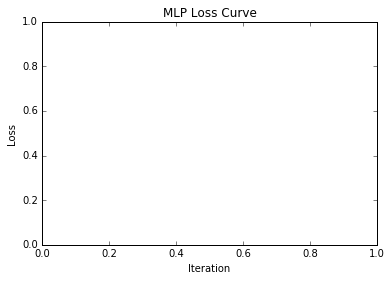

Training set score: 0.905777


/usr/local/lib/python2.7/dist-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [22]:
mlp.fit(X, y)
print("Training set score: %f" % mlp.score(X, y))

plt.title('MLP Loss Curve')
plt.plot(mlp.loss_curve_)
plt.ylabel('Loss')
plt.xlabel('Iteration')
plt.show()
#Plot on validation ~70% training, testing, validation 

In [23]:
# Create the targets
y_signal_test = np.ones(len(signal_t))
y_backgr_test = np.zeros(len(backgr_t))

signal_zip_test = zip(signal_t, y_signal_test)
backgr_zip_test = zip(backgr_t, y_backgr_test)

X_merge_test = np.concatenate((signal_zip_test, backgr_zip_test))

np.random.shuffle(X_merge_test)
np.random.shuffle(signal_zip_test)
np.random.shuffle(backgr_zip_test)

X_list_test, y_list_test = map(list, zip(*X_merge_test))
X_list_test_signal, y_list_test_signal = map(list, zip(*signal_zip_test))
X_list_test_backgr, y_list_test_backgr = map(list, zip(*backgr_zip_test))

X_test = np.array(X_list_test)
print "Shape of X_test: " + str(X_test.shape)

y_test = np.array(y_list_test)
print "Shape of y_test: " + str(y_test.shape)

#X_test = scaleArr(X_test,param_min,param_max)
#transformer_test = MinMaxScaler().fit(X_test)
#X_test = transformer_test.transform(X_test)
X_test = transformer.transform(X_test)
#X_test = shiftArr(X_test,-0.5)
#X_test = transformer2.transform(X_test)

Shape of X_test: (38292, 17)
Shape of y_test: (38292,)


In [24]:
y_predictions = mlp.predict(X_test)
y_predictions_proba = mlp.predict_proba(X_test)

#X_test = transformer_test.inverse_transform(X_test)
#X_test = transformer2.inverse_transform(X_test)
#X_test = shiftArr(X_test,0.5)
X_test = transformer.inverse_transform(X_test)
#X_test = scaleArrInv(X_test,param_min,param_max)

from sklearn.model_selection import cross_val_score
#scores = cross_val_score(mlp, X, y, cv=5)
#scores
#scores2 = cross_val_score(mlp, X_test, y_test, cv=5)
#scores2

/usr/local/lib/python2.7/dist-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


67
1422.72
2762.24
1.94152046784


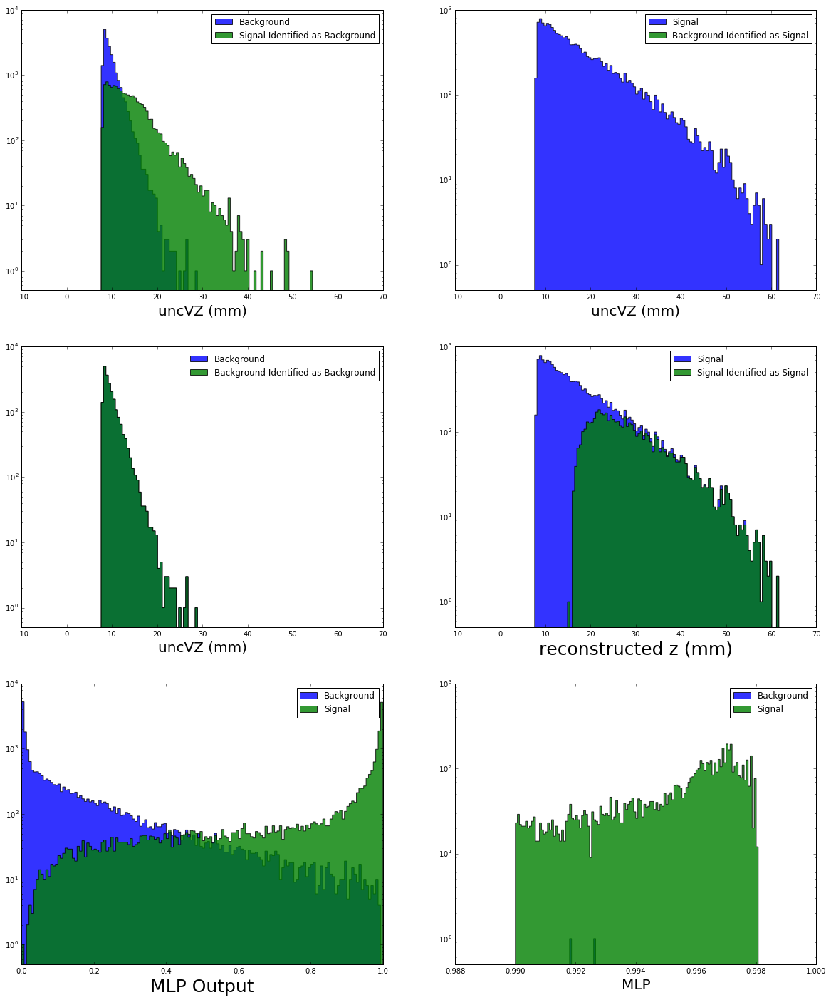

In [26]:
mlp_cut = 0.993
zcut = 27
nBins = 150

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5)) = plt.subplots(nrows=3, ncols=2, figsize=(20,24))

ax0.hist(X_test[:, uncVZi][y_test == 0], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Background")
ax0.hist(X_test[:, uncVZi][np.logical_and(y_predictions_proba[:,1] < mlp_cut, y_test == 1)], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Signal Identified as Background")
ax1.hist(X_test[:, uncVZi][y_test == 1], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Signal")
ax1.hist(X_test[:, uncVZi][np.logical_and(y_predictions_proba[:,1] > mlp_cut, y_test == 0)], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Background Identified as Signal")

ax2.hist(X_test[:, uncVZi][y_test == 0], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Background")
ax2.hist(X_test[:, uncVZi][np.logical_and(y_predictions_proba[:,1] < mlp_cut, y_test == 0)], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Background Identified as Background")
ax3.hist(X_test[:, uncVZi][y_test == 1], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Signal")
n, bins, _ = ax3.hist(X_test[:, uncVZi][np.logical_and(y_predictions_proba[:,1] > mlp_cut, y_test == 1)], nBins, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Signal Identified as Signal")

ax4.hist(y_predictions_proba[:,1][y_test == 0], bins=150, range=(0, 1), alpha=0.8, histtype="stepfilled", label="Background")
ax4.hist(y_predictions_proba[:,1][y_test == 1], bins=150, range=(0, 1), alpha=0.8, histtype="stepfilled", label="Signal")

ax5.hist(y_predictions_proba[:,1][y_test == 0], bins=150, range=(0.99, 1), alpha=0.8, histtype="stepfilled", label="Background")
ax5.hist(y_predictions_proba[:,1][y_test == 1], bins=150, range=(0.99, 1), alpha=0.8, histtype="stepfilled", label="Signal")

ax0.set_yscale("log")
ax1.set_yscale("log")
ax2.set_yscale("log")
ax3.set_yscale("log")
ax4.set_yscale("log")
ax5.set_yscale("log")

ax0.set_ylim(0.5)
ax1.set_ylim(0.5)
ax2.set_ylim(0.5)
ax3.set_ylim(0.5)
ax4.set_ylim(0.5)
ax5.set_ylim(0.5)

ax0.legend(loc=1)
ax1.legend(loc=1)
ax2.legend(loc=1)
ax3.legend(loc=1)
ax4.legend(loc=1)
ax5.legend(loc=1)

ax0.set_xlabel("uncVZ (mm)", fontsize=20)
ax1.set_xlabel("uncVZ (mm)", fontsize=20)
ax2.set_xlabel("uncVZ (mm)", fontsize=20)
ax3.set_xlabel("reconstructed z (mm)", fontsize=25)
ax4.set_xlabel("MLP Output", fontsize=25)
ax5.set_xlabel("MLP", fontsize=20)

bin_width = bins[1] - bins[0]
zCut_bin = int((zcut-param_min[uncVZi])/(param_max[uncVZi]-param_min[uncVZi])*nBins)
signal_yield_old = bin_width * sum(n[zCut_bin:nBins])
signal_yield_new = bin_width * sum(n[0:nBins])
print zCut_bin
print signal_yield_old
print signal_yield_new
print signal_yield_new/signal_yield_old

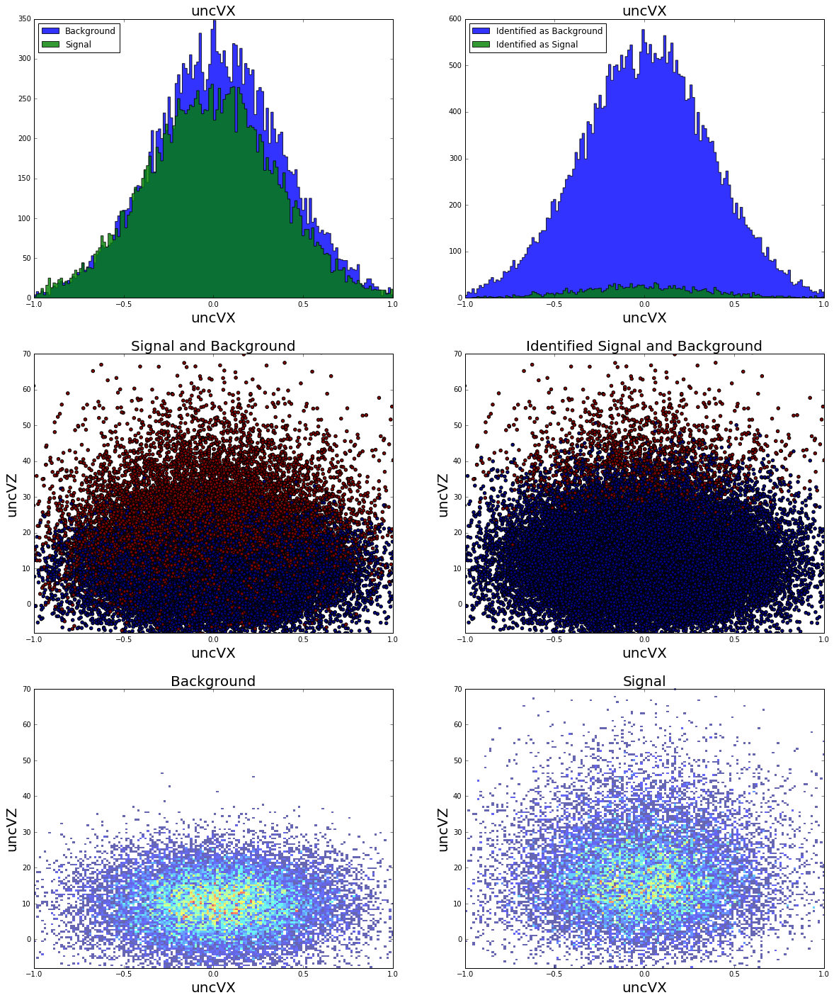

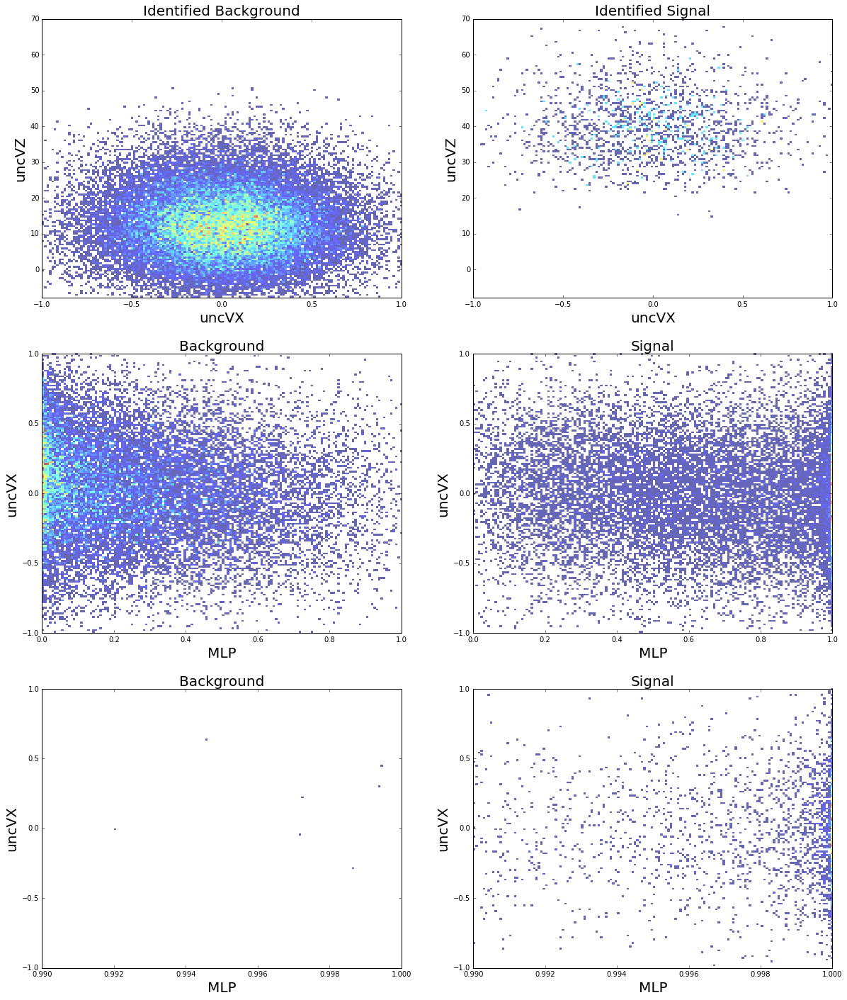

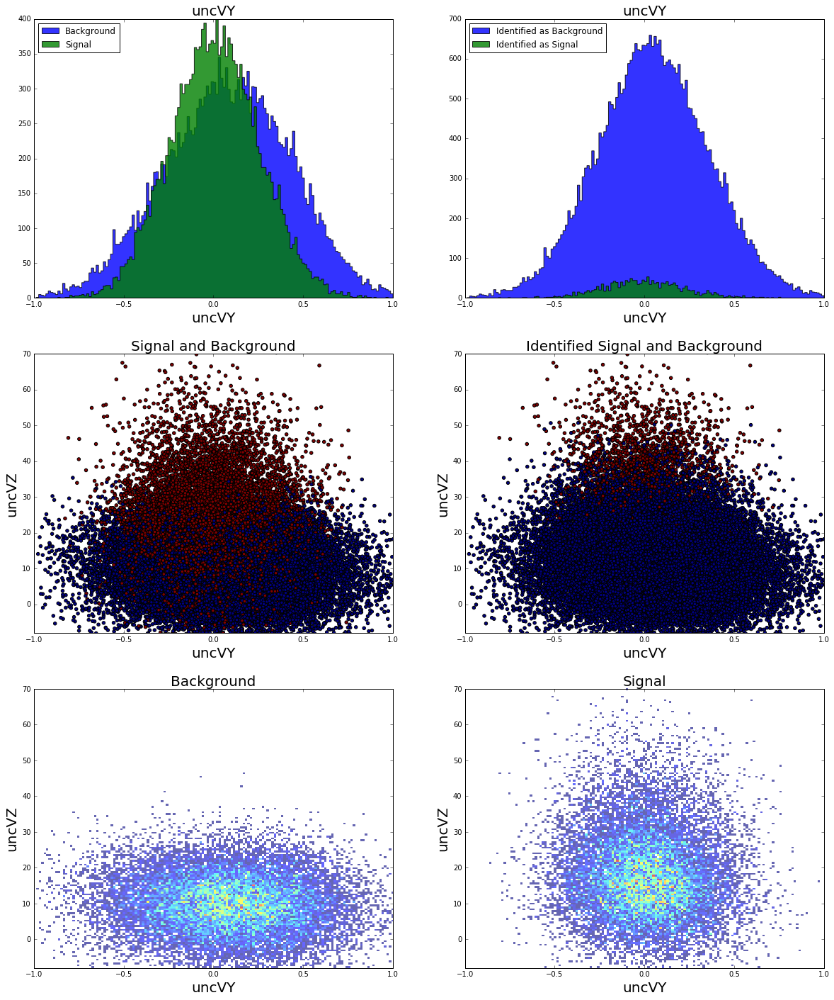

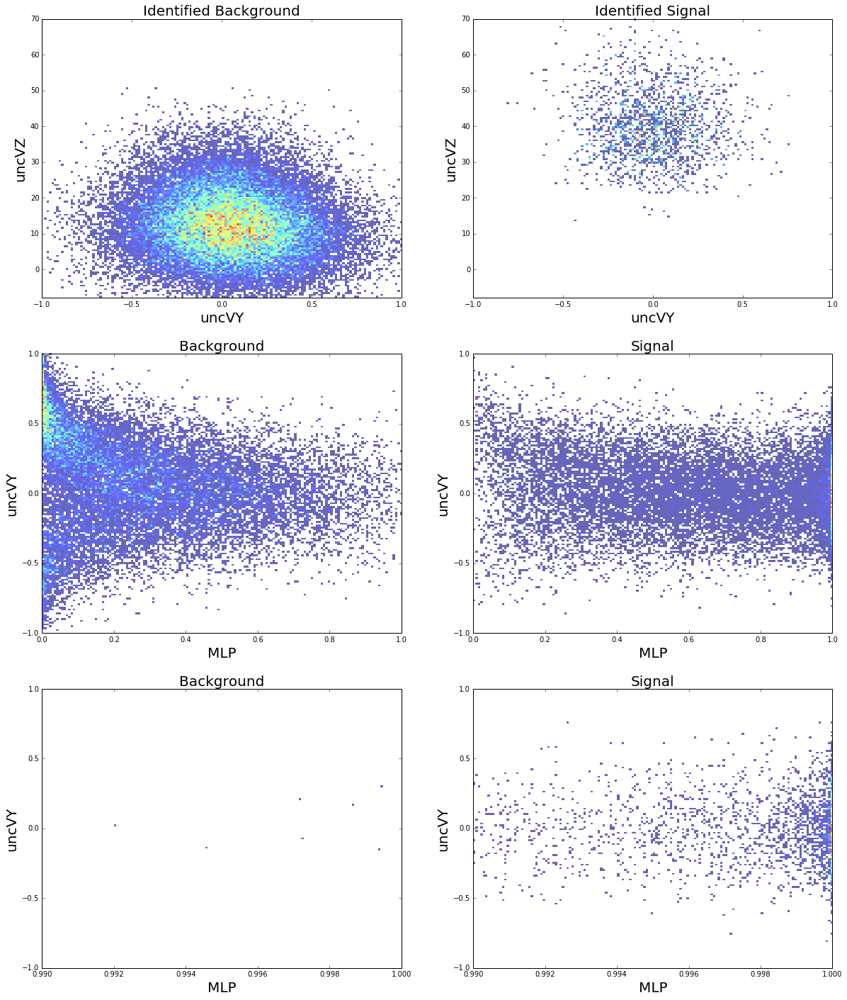

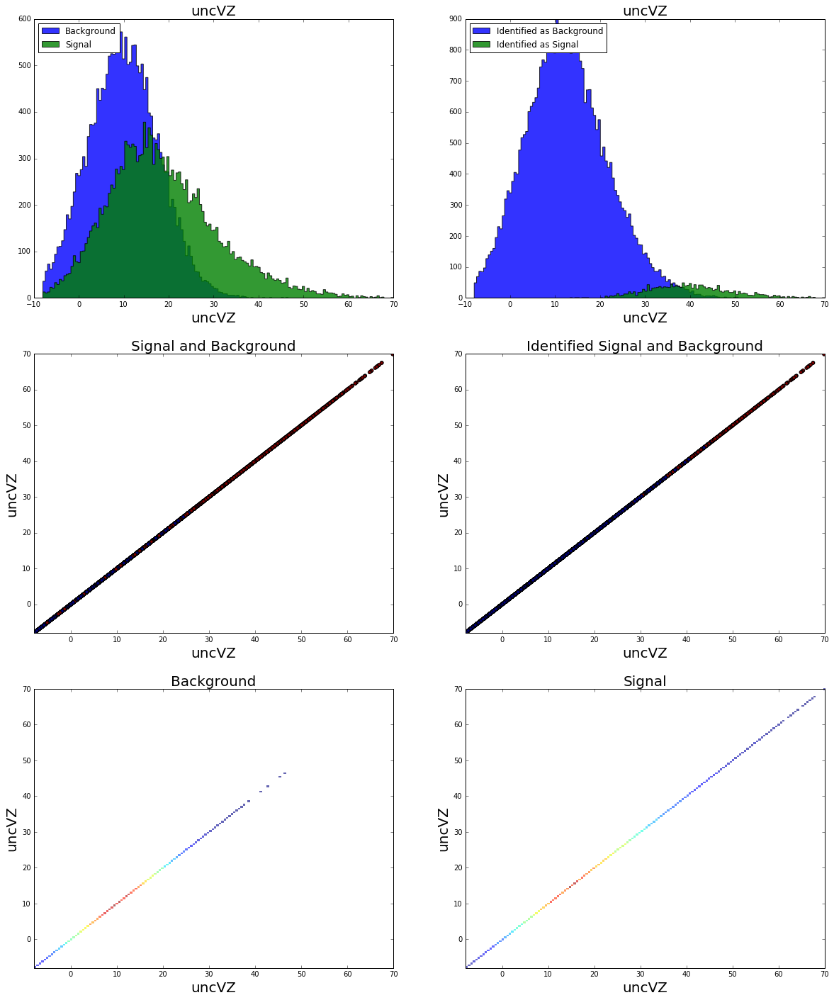

...

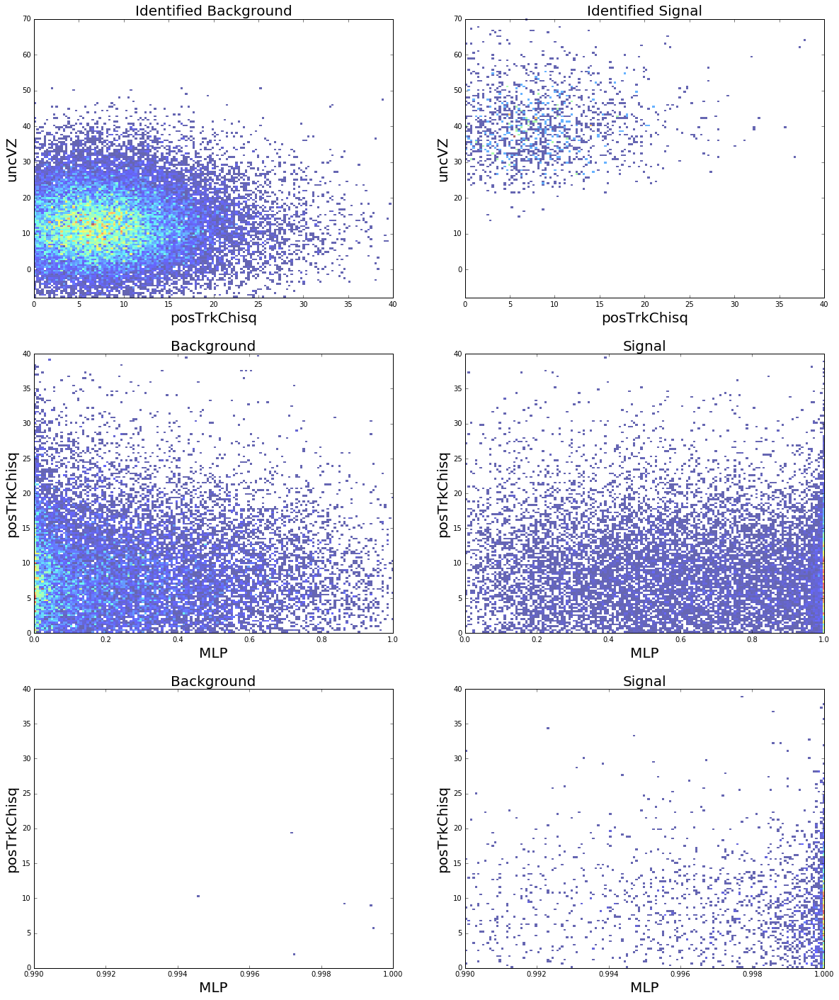

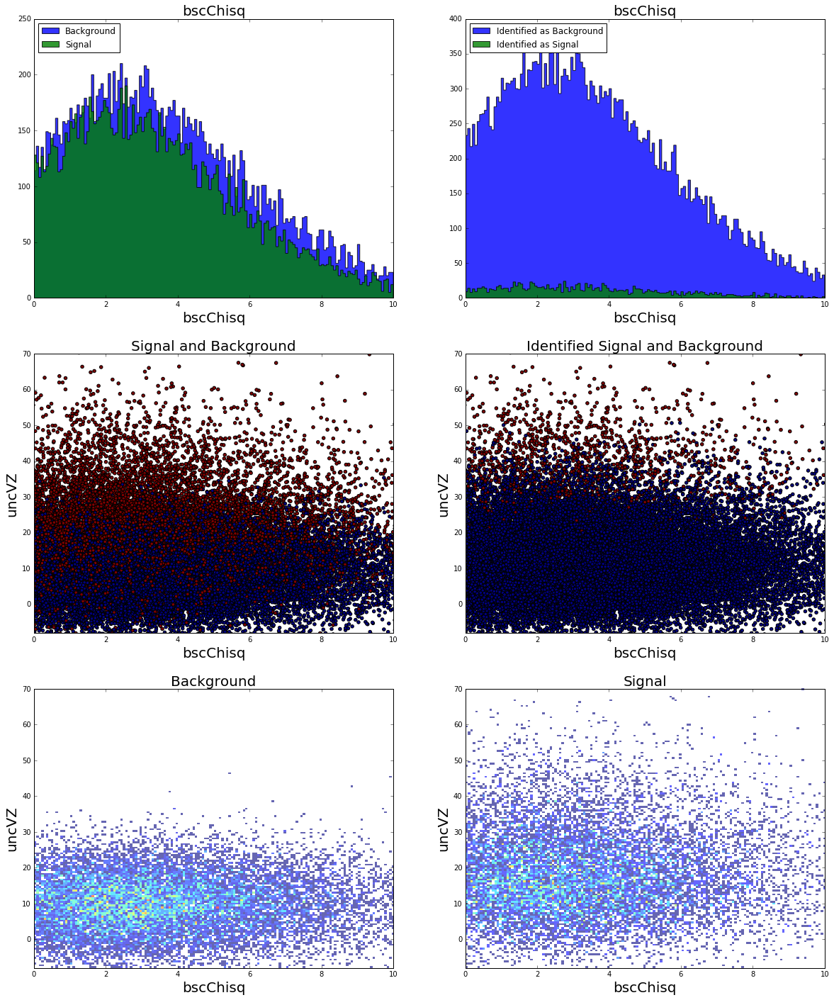

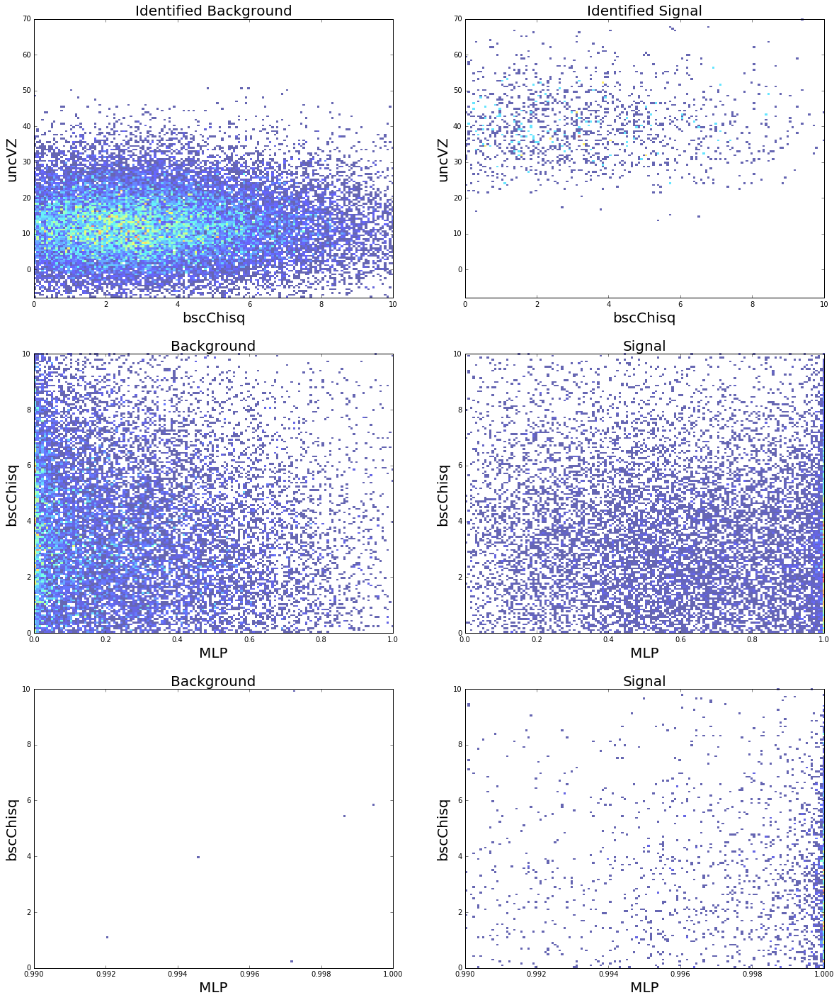

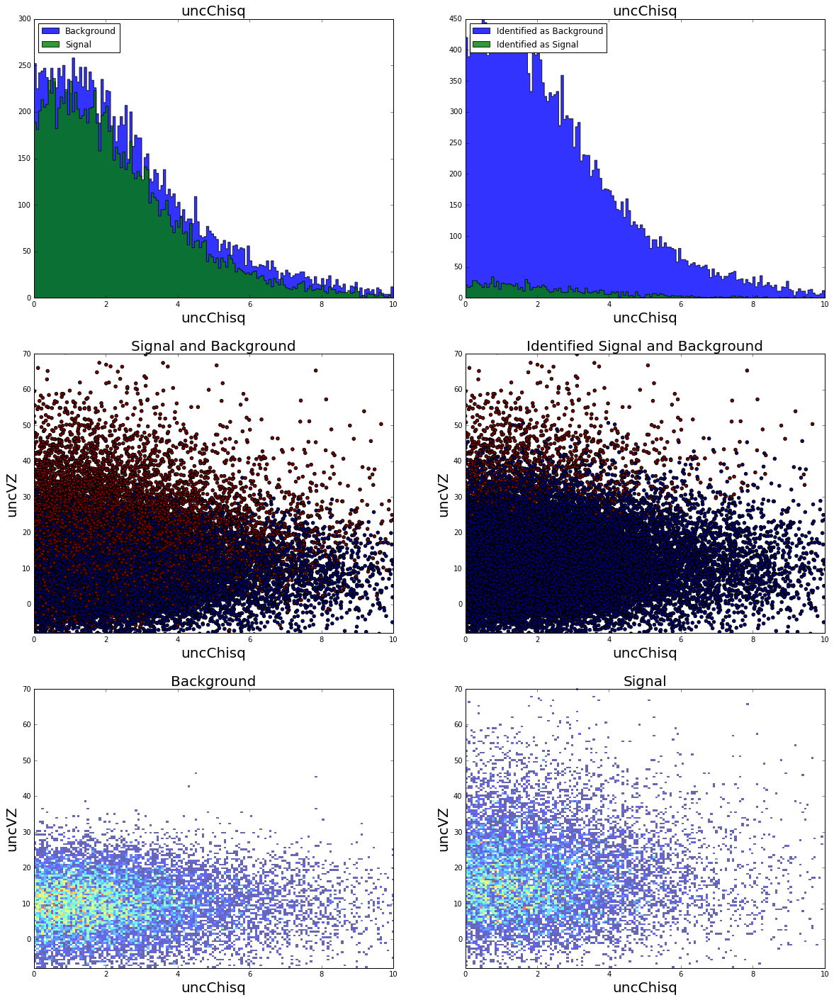

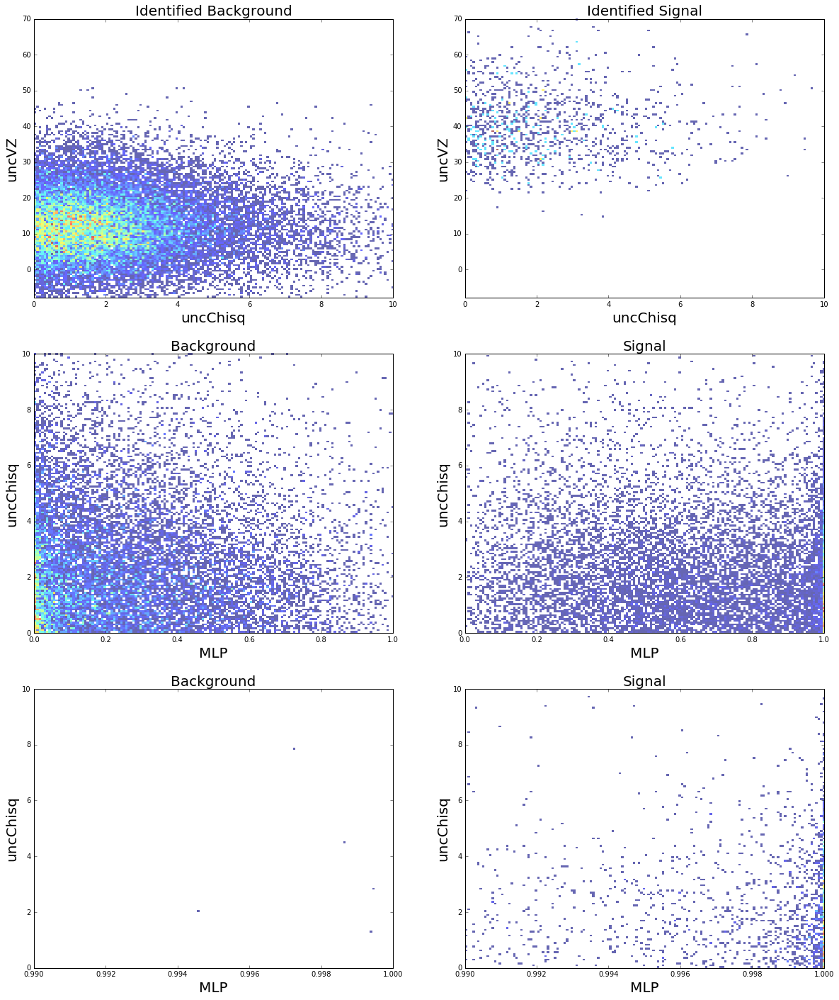

In [133]:
i = 0
for name in param_list:
    fig, ((ax0, ax1),(ax2, ax3), (ax4, ax5)) = plt.subplots(nrows=3, ncols=2, figsize=(20,24))
    fig, ((ax6, ax7), (ax8, ax9), (ax10, ax11)) = plt.subplots(nrows=3, ncols=2, figsize=(20,24))
    
    ax0.hist(X_test[:, i][y_test == 0], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Background")
    ax0.hist(X_test[:, i][y_test == 1], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Signal")
    ax1.hist(X_test[:, i][y_predictions_proba[:,1] < mlp_cut], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Identified as Background")
    ax1.hist(X_test[:, i][y_predictions_proba[:,1] > mlp_cut], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Identified as Signal")
    
    ax0.set_title(name, fontsize=20)
    ax0.set_xlabel(name, fontsize=20)
    ax0.legend(loc=2)
    ax1.set_title(name, fontsize=20)
    ax1.set_xlabel(name, fontsize=20)
    ax1.legend(loc=2)
    
    ax2.scatter(X_test[:, i], X_test[:, uncVZi], c=y_predictions,label = name)
    ax3.scatter(X_test[:, i], X_test[:, uncVZi], c=y_predictions_proba[:,1] > mlp_cut,label = name)
    
    ax2.set_title('Signal and Background', fontsize=20)
    ax2.set_xlabel(name, fontsize=20)
    ax2.set_ylabel('uncVZ', fontsize=20)  
    ax2.set_xlim(param_min[i], param_max[i])
    ax2.set_ylim(param_min[uncVZi], param_max[uncVZi])
    ax3.set_title('Identified Signal and Background', fontsize=20)
    ax3.set_xlabel(name, fontsize=20)
    ax3.set_ylabel('uncVZ', fontsize=20)
    ax3.set_xlim(param_min[i], param_max[i])
    ax3.set_ylim(param_min[uncVZi], param_max[uncVZi])
    
    ax4.hist2d(X_test[:, i][y_test == 0], X_test[:, uncVZi][y_test == 0], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Background", cmin=0.5)
    ax5.hist2d(X_test[:, i][y_test == 1], X_test[:, uncVZi][y_test == 1], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Signal", cmin=0.5)
    
    ax4.set_title('Background', fontsize=20)
    ax4.set_xlabel(name, fontsize=20)
    ax4.set_ylabel('uncVZ', fontsize=20)
    ax5.set_title('Signal', fontsize=20)
    ax5.set_xlabel(name, fontsize=20)
    ax5.set_ylabel('uncVZ', fontsize=20)
    
    ax6.hist2d(X_test[:, i][y_predictions_proba[:,1] < mlp_cut], X_test[:, uncVZi][y_predictions_proba[:,1] < mlp_cut], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Identified as Background", cmin=0.5)
    ax7.hist2d(X_test[:, i][y_predictions_proba[:,1] > mlp_cut], X_test[:, uncVZi][y_predictions_proba[:,1] > mlp_cut], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Identified as Signal", cmin=0.5)
    
    ax6.set_title('Identified Background', fontsize=20)
    ax6.set_xlabel(name, fontsize=20)
    ax6.set_ylabel('uncVZ', fontsize=20)
    ax7.set_title('Identified Signal', fontsize=20)
    ax7.set_xlabel(name, fontsize=20)
    ax7.set_ylabel('uncVZ', fontsize=20)
    
    ax8.hist2d(y_predictions_proba[:,1][y_test == 0], X_test[:, i][y_test == 0], range=[[0,1],[param_min[i], param_max[i]]], bins=150, alpha=0.6, label="Background", cmin=0.5)
    ax9.hist2d(y_predictions_proba[:,1][y_test == 1], X_test[:, i][y_test == 1], range=[[0,1],[param_min[i], param_max[i]]], bins=150, alpha=0.6, label="Signal", cmin=0.5)
    
    ax8.set_title('Background', fontsize=20)
    ax8.set_xlabel('MLP', fontsize=20)
    ax8.set_ylabel(name, fontsize=20)
    ax9.set_title('Signal', fontsize=20)
    ax9.set_xlabel('MLP', fontsize=20)
    ax9.set_ylabel(name, fontsize=20)
    
    ax10.hist2d(y_predictions_proba[:,1][y_test == 0], X_test[:, i][y_test == 0], range=[[0.99,1],[param_min[i], param_max[i]]], bins=150, alpha=0.6, label="Background", cmin=0.5)
    ax11.hist2d(y_predictions_proba[:,1][y_test == 1], X_test[:, i][y_test == 1], range=[[0.99,1],[param_min[i], param_max[i]]], bins=150, alpha=0.6, label="Signal", cmin=0.5)
    
    ax10.set_title('Background', fontsize=20)
    ax10.set_xlabel('MLP', fontsize=20)
    ax10.set_ylabel(name, fontsize=20)
    ax11.set_title('Signal', fontsize=20)
    ax11.set_xlabel('MLP', fontsize=20)
    ax11.set_ylabel(name, fontsize=20)
    
    i = i + 1

/usr/lib/python2.7/dist-packages/matplotlib/colors.py:1018: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


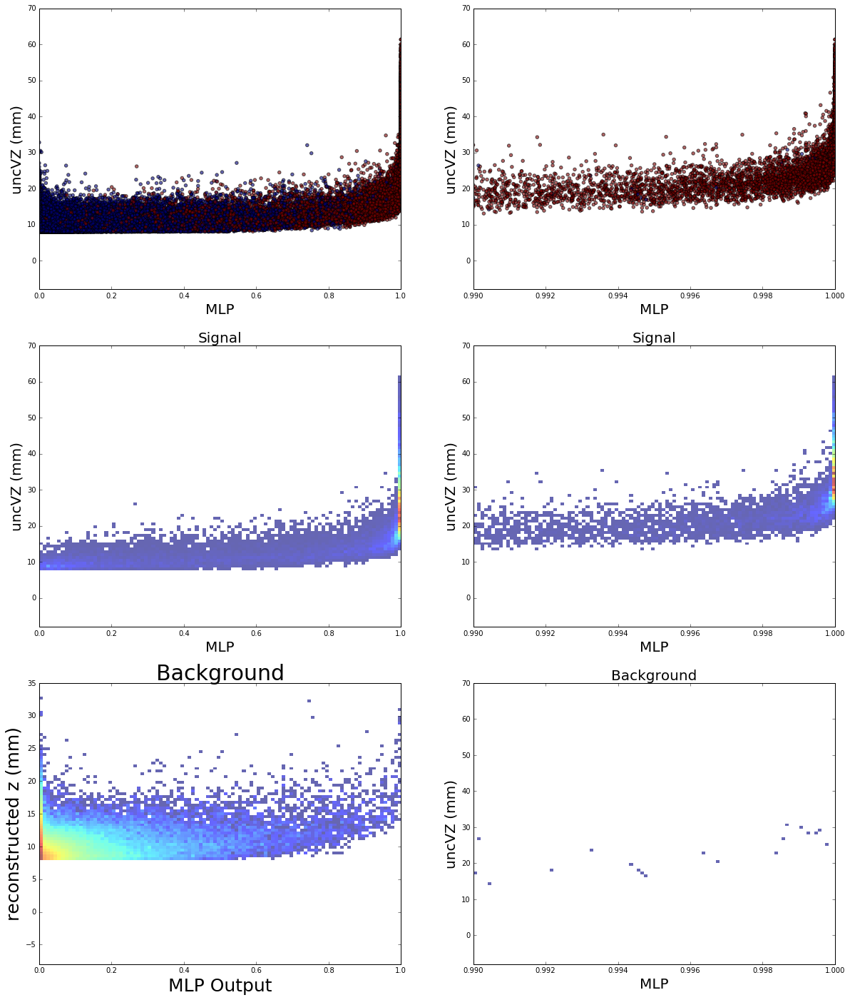

In [12]:
from matplotlib.colors import LogNorm

fig, ((ax0, ax1),(ax2, ax3),(ax4, ax5)) = plt.subplots(nrows=3, ncols=2, figsize=(20,24))
ax0.scatter(y_predictions_proba[:,1], X_test[:,uncVZi], c=y_test, alpha=0.6)
ax1.scatter(y_predictions_proba[:,1], X_test[:,uncVZi], c=y_test, alpha=0.6)
ax0.set_xlim(0,1)
ax0.set_ylim(param_min[uncVZi], param_max[uncVZi])
ax0.set_xlabel("MLP", fontsize=20)
ax0.set_ylabel("uncVZ (mm)", fontsize=20)
ax1.set_xlabel("MLP", fontsize=20)
ax1.set_ylabel("uncVZ (mm)", fontsize=20)
ax1.set_xlim(0.99,1)
ax1.set_ylim(param_min[uncVZi], param_max[uncVZi])

ax2.hist2d(y_predictions_proba[:,1][y_test == 1], X_test[:,uncVZi][y_test == 1], bins=100, range=[[0,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)
ax3.hist2d(y_predictions_proba[:,1][y_test == 1], X_test[:,uncVZi][y_test == 1], bins=100, range=[[0.99,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)
ax2.set_xlabel("MLP", fontsize=20)
ax2.set_ylabel("uncVZ (mm)", fontsize=20)
ax2.set_title("Signal", fontsize=20)
ax3.set_xlabel("MLP", fontsize=20)
ax3.set_ylabel("uncVZ (mm)", fontsize=20)
ax3.set_title("Signal", fontsize=20)

ax4.hist2d(y_predictions_proba[:,1][y_test == 0], X_test[:,uncVZi][y_test == 0], bins=100, range=[[0,1],[param_min[uncVZi], 35]], alpha=0.6, cmin=0.5, norm=LogNorm())
#ax4.hist2d(y_predictions_proba[:,1][y_test == 0], X_test[:,uncVZi][y_test == 0], bins=100, range=[[0,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)
ax5.hist2d(y_predictions_proba[:,1][y_test == 0], X_test[:,uncVZi][y_test == 0], bins=100, range=[[0.99,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)
ax4.set_xlabel("MLP", fontsize=20)
ax4.set_ylabel("uncVZ (mm)", fontsize=20)
ax4.set_title("Background", fontsize=20)
ax5.set_xlabel("MLP", fontsize=20)
ax5.set_ylabel("uncVZ (mm)", fontsize=20)
ax5.set_title("Background", fontsize=20)

#ax4.set_zscale("log")
ax4.set_xlabel("MLP Output", fontsize=25)
ax4.set_ylabel("reconstructed z (mm)", fontsize=25)
ax4.set_title("Background", fontsize=30)

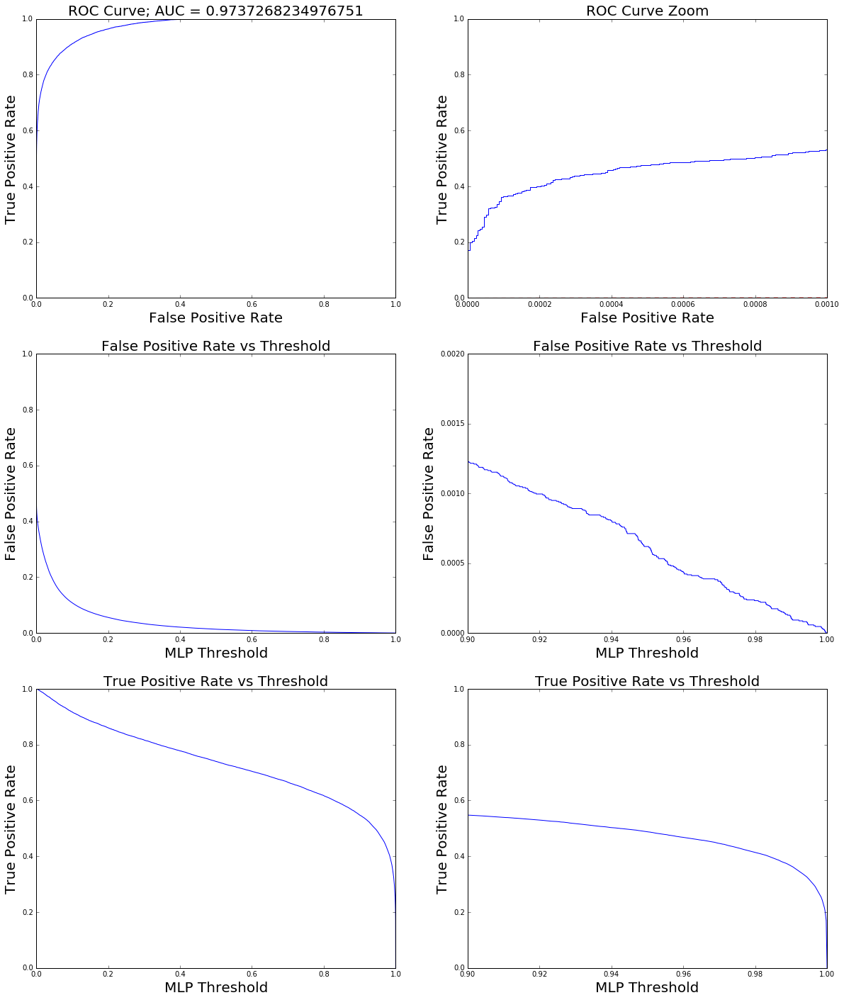

In [15]:
from sklearn.metrics import roc_curve, auc

fpr_max = 0.0002
fpr, tpr, threshold = roc_curve(y_test, y_predictions_proba[:,1])
roc_auc = auc(fpr, tpr)
roc_auc_max = auc(fpr, tpr)#, max_fpr=fpr_max)

fig, ((ax0, ax1),(ax2, ax3), (ax4, ax5)) = plt.subplots(nrows=3, ncols=2, figsize=(20,24))
ax0.set_title('ROC Curve; AUC = ' + str(roc_auc),fontsize=20)
ax0.plot(fpr, tpr, label = '')
#ax0.legend(loc = 'lower right')
#ax0.plot([0, 1], [0, 1],'r--')
#ax0.set_xlim([0, 1])
ax0.set_ylim([0, 1])
ax0.set_ylabel('True Positive Rate',fontsize=20)
ax0.set_xlabel('False Positive Rate',fontsize=20)

ax1.set_title('ROC Curve Zoom',fontsize=20)#; AUC (fpr max = ' + str(fpr_max) + ') = ' + str(roc_auc_max),fontsize=20)
ax1.plot(fpr, tpr, label = '')
#ax1.legend(loc = 'lower right')
ax1.plot([0, 1], [0, 1],'r--')
ax1.set_xlim([0, fpr_max*5])
ax1.set_ylim([0, 1])
ax1.set_ylabel('True Positive Rate',fontsize=20)
ax1.set_xlabel('False Positive Rate',fontsize=20)

ax2.set_title('False Positive Rate vs Threshold',fontsize=20)
ax2.plot(threshold, fpr, label = '')
#ax2.set_xlim([0, 1])
#ax2.set_ylim([0, 1])
ax2.set_xlabel('MLP Threshold',fontsize=20)
ax2.set_ylabel('False Positive Rate',fontsize=20)

ax3.set_title('False Positive Rate vs Threshold',fontsize=20)
ax3.plot(threshold, fpr, label = '')
ax3.set_xlim([0.9, 1])
ax3.set_ylim([0, 0.002])
ax3.set_xlabel('MLP Threshold',fontsize=20)
ax3.set_ylabel('False Positive Rate',fontsize=20)

ax4.set_title('True Positive Rate vs Threshold',fontsize=20)
ax4.plot(threshold, tpr, label = '')
#ax4.set_xlim([0, 1])
#ax4.set_ylim([0, 1])
ax4.set_ylabel('True Positive Rate',fontsize=20)
ax4.set_xlabel('MLP Threshold',fontsize=20)

ax5.set_title('True Positive Rate vs Threshold',fontsize=20)
ax5.plot(threshold, tpr, label = '')
ax5.set_xlim([0.9, 1])
ax5.set_ylim([0, 1])
ax5.set_ylabel('True Positive Rate',fontsize=20)
ax5.set_xlabel('MLP Threshold',fontsize=20)

#ax0.set_yscale("log")
#ax1.set_yscale("log")
#ax2.set_yscale("log")
#ax3.set_yscale("log")
#ax4.set_yscale("log")
#ax5.set_yscale("log")

#ax0.set_xscale("log")
#ax1.set_xscale("log")
#ax2.set_xscale("log")
#ax3.set_xscale("log")
#ax4.set_xscale("log")
#ax5.set_xscale("log")

In [41]:
#import home.mrsolt.hps.HPS-CODE.ANALYSIS.vertexing.upperlimit.upperlimit
import sys
sys.path.insert(0, '/home/mrsolt/hps/HPS-CODE/ANALYSIS/vertexing/upperlimit')
import upperlimit
import numpy

CL = 0.9
cdfAtZcut = signal_yield_new
no_candidates = True
if (cdfAtZcut == 0):
            cdfAtZcut = 10**-20
if (no_candidates):
    dataArray=numpy.zeros(2)
    dataArray[1] = cdfAtZcut
#else:
#    dataArray=numpy.zeros(dataPastCut.numEntries()+2)
#    dataArray[0] = 0.0
#    for k in range(0,dataPastCut.numEntries()):
#        thisX = dataPastCut.get(k).getRealValue("uncVZ")
#        w.var("uncVZ").setVal(thisX)
#        dataArray[k+1]=(cdfAtZcut-effHisto.Integral(effHisto.GetXaxis().FindBin(thisX),effHisto.GetXaxis().FindBin(maxz),"width"))
#    dataArray[dataPastCut.numEntries()+1] = cdfAtZcut
dataArray/= (cdfAtZcut)
dataArray.sort()
output = upperlimit.upperlim(CL, 1, dataArray, 0., dataArray)
masscut_eff = 1.0
sig_integral = signal_yield_new
ap_yield = 12.
eps = -9
limit_detectable = output[0] # this is a limit on number of detectable A' (past zcut, within mass cut)
limit_allz = limit_detectable/((cdfAtZcut/sig_integral)*masscut_eff) # this is a limit on number of detectable A' if we didn't have zcut or mass cut
limit_production = limit_allz/sig_integral # limit on number of produced A'
limit_eps = limit_production/ap_yield
limit_scaled = limit_eps/10**eps

print limit_scaled

[[19223  1601]
 [ 1576 15892]]
             precision    recall  f1-score   support

        0.0       0.92      0.92      0.92     20824
        1.0       0.91      0.91      0.91     17468

avg / total       0.92      0.92      0.92     38292



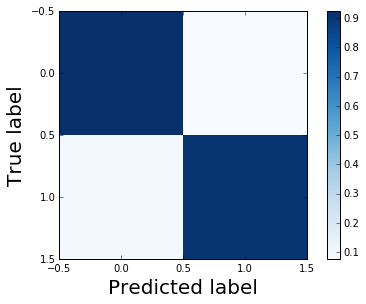

In [14]:
from sklearn.metrics import classification_report,confusion_matrix

cm = confusion_matrix(y_test, y_predictions)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
cmap=plt.cm.Blues
plt.imshow(cm_normalized, interpolation='nearest', cmap=cmap)
plt.colorbar()
plt.tight_layout()
plt.ylabel('True label',fontsize=20)
plt.xlabel('Predicted label',fontsize=20)

print(confusion_matrix(y_test,y_predictions))
print(classification_report(y_test,y_predictions))

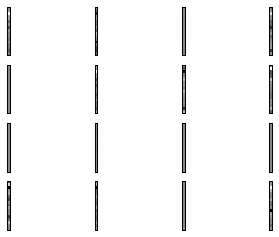

In [15]:
fig, axes = plt.subplots(4, 4)
# use global min / max to ensure all weights are shown on the same scale
vmin, vmax = mlp.coefs_[0].min(), mlp.coefs_[0].max()

for coef, ax in zip(mlp.coefs_[0].T, axes.ravel()):
    ax.matshow(coef.reshape(len(param_names),1),cmap=plt.cm.gray, vmin=.5 * vmin, vmax=.5 * vmax)
    ax.set_xticks(())
    ax.set_yticks(())

plt.show()

In [16]:
# Create the targets
y_data = np.ones(len(data))
y_mc = np.zeros(len(backgr_t))

#data_zip_test = zip(data, y_data)
X_merge_data = zip(data, y_data)
X_merge_mc = zip(backgr_t, y_mc)
#backgr_zip_test = zip(backgr_t, y_backgr_test)

#X_merge_data = np.concatenate((data_zip_test, backgr_zip_test))

np.random.shuffle(X_merge_data)
np.random.shuffle(X_merge_mc)
#np.random.shuffle(signal_zip_test)
#np.random.shuffle(backgr_zip_test)

X_list_data, y_list_data = map(list, zip(*X_merge_data))
X_list_mc, y_list_mc = map(list, zip(*X_merge_mc))
#X_list_test_signal, y_list_test_signal = map(list, zip(*signal_zip_test))
#X_list_test_backgr, y_list_test_backgr = map(list, zip(*backgr_zip_test))

X_data = np.array(X_list_data)
X_mc = np.array(X_list_mc)

print "Shape of X_data: " + str(X_data.shape)

print "Shape of X_mc: " + str(X_mc.shape)

#y_data = np.array(y_list_data)
#print "Shape of y_test: " + str(y_data.shape)

#X_test = scaleArr(X_test,param_min,param_max)
#transformer_data = MinMaxScaler().fit(X_data)
#X_data = transformer_data.transform(X_data)
X_data = transformer.transform(X_data)
X_mc = transformer.transform(X_mc)
#X_data = transformer2.transform(X_data)
#X_mc = transformer2.transform(X_mc)

Shape of X_data: (20058, 17)
Shape of X_mc: (20824, 17)


In [17]:
y_predictions_data = mlp.predict(X_data)
y_predictions_proba_data = mlp.predict_proba(X_data)

y_predictions_mc = mlp.predict(X_mc)
y_predictions_proba_mc = mlp.predict_proba(X_mc)

#X_data = transformer_data.inverse_transform(X_data)
#X_data = transformer2.inverse_transform(X_data)
#X_mc = transformer2.inverse_transform(X_mc)
X_data = transformer.inverse_transform(X_data)
X_mc = transformer.inverse_transform(X_mc)

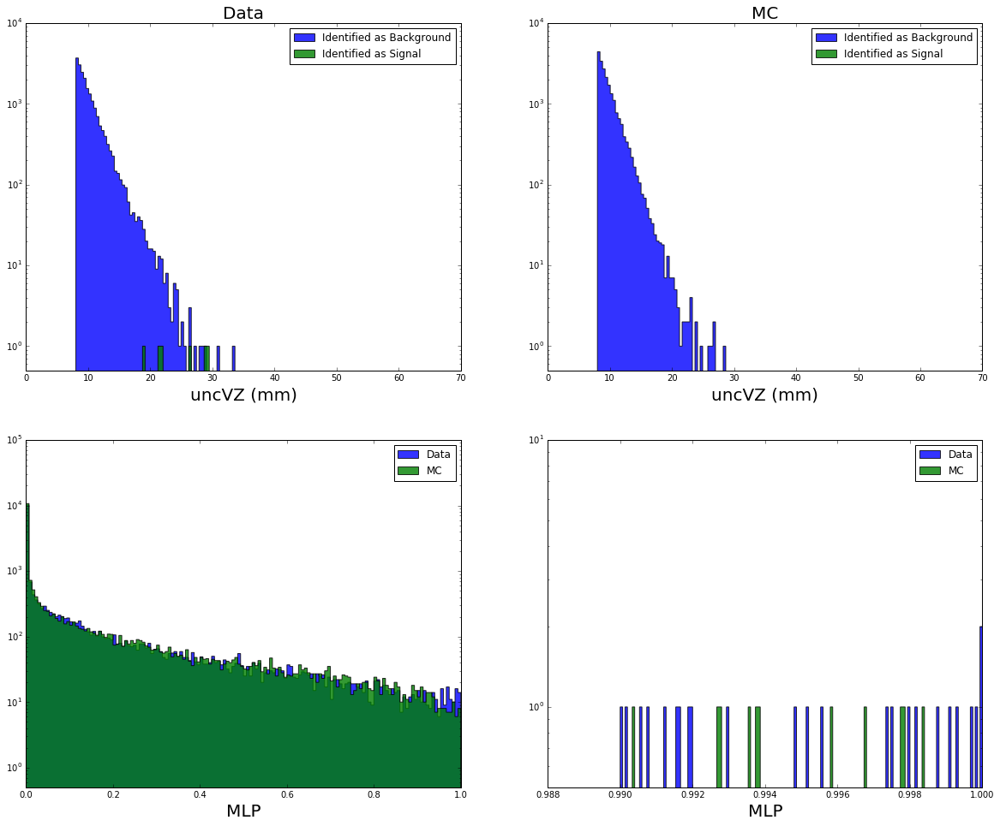

In [18]:
fig, ((ax0, ax1),(ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(20,16))

ax0.hist(X_data[:, uncVZi][y_predictions_proba_data[:,1] < mlp_cut], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Identified as Background")
ax0.hist(X_data[:, uncVZi][y_predictions_proba_data[:,1] > mlp_cut], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Identified as Signal")

ax1.hist(X_mc[:, uncVZi][y_predictions_proba_mc[:,1] < mlp_cut], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Identified as Background")
ax1.hist(X_mc[:, uncVZi][y_predictions_proba_mc[:,1] > mlp_cut], bins=150, range=(param_min[uncVZi], param_max[uncVZi]), alpha=0.8, histtype="stepfilled", label="Identified as Signal")

ax2.hist(y_predictions_proba_data[:,1], bins=150, range=(0, 1), alpha=0.8, histtype="stepfilled", label="Data")
ax2.hist(y_predictions_proba_mc[:,1], bins=150, range=(0, 1), alpha=0.8, histtype="stepfilled", label="MC")

ax3.hist(y_predictions_proba_data[:,1], bins=150, range=(0.99, 1), alpha=0.8, histtype="stepfilled", label="Data")
ax3.hist(y_predictions_proba_mc[:,1], bins=150, range=(0.99, 1), alpha=0.8, histtype="stepfilled", label="MC")

ax0.set_yscale("log")
ax1.set_yscale("log")
ax2.set_yscale("log")
ax3.set_yscale("log")

ax0.set_ylim(0.5)
ax1.set_ylim(0.5)
ax2.set_ylim(0.5)
ax3.set_ylim(0.5)

ax0.set_title("Data", fontsize=20)
ax1.set_title("MC", fontsize=20)

ax0.legend(loc=1)
ax1.legend(loc=1)
ax2.legend(loc=1)
ax3.legend(loc=1)

ax0.set_xlabel("uncVZ (mm)", fontsize=20)
ax1.set_xlabel("uncVZ (mm)", fontsize=20)
ax2.set_xlabel("MLP", fontsize=20)
ax3.set_xlabel("MLP", fontsize=20)

/usr/lib/python2.7/dist-packages/matplotlib/colors.py:941: UserWarning: Warning: converting a masked element to nan.
  vmin = float(vmin)
/usr/lib/python2.7/dist-packages/matplotlib/colors.py:942: UserWarning: Warning: converting a masked element to nan.
  vmax = float(vmax)


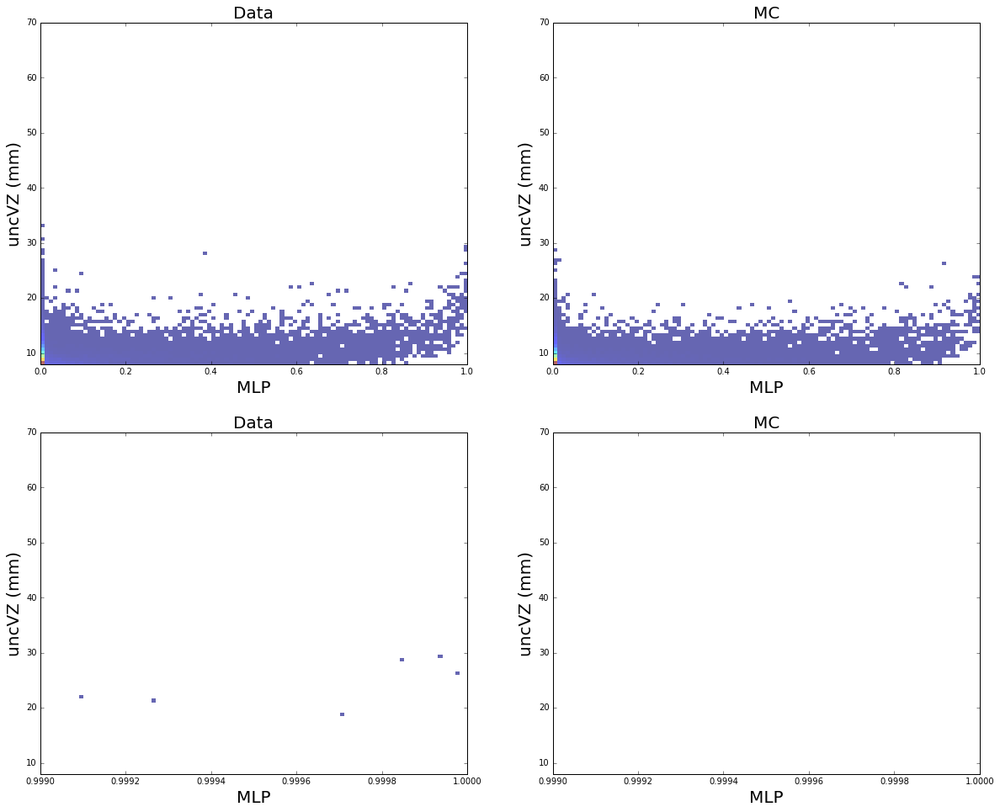

In [19]:
fig, ((ax0, ax1),(ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(20,16))

ax0.hist2d(y_predictions_proba_data[:,1], X_data[:,uncVZi], bins=100, range=[[0,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)
ax1.hist2d(y_predictions_proba_mc[:,1], X_mc[:,uncVZi], bins=100, range=[[0,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)

ax2.hist2d(y_predictions_proba_data[:,1], X_data[:,uncVZi], bins=100, range=[[0.999,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)
ax3.hist2d(y_predictions_proba_mc[:,1], X_mc[:,uncVZi], bins=100, range=[[0.999,1],[param_min[uncVZi], param_max[uncVZi]]], alpha=0.6, cmin=0.5)

ax0.set_xlabel("MLP", fontsize=20)
ax0.set_ylabel("uncVZ (mm)", fontsize=20)
ax0.set_title("Data", fontsize=20)
ax1.set_xlabel("MLP", fontsize=20)
ax1.set_ylabel("uncVZ (mm)", fontsize=20)
ax1.set_title("MC", fontsize=20)

ax2.set_xlabel("MLP", fontsize=20)
ax2.set_ylabel("uncVZ (mm)", fontsize=20)
ax2.set_title("Data", fontsize=20)
ax3.set_xlabel("MLP", fontsize=20)
ax3.set_ylabel("uncVZ (mm)", fontsize=20)
ax3.set_title("MC", fontsize=20)

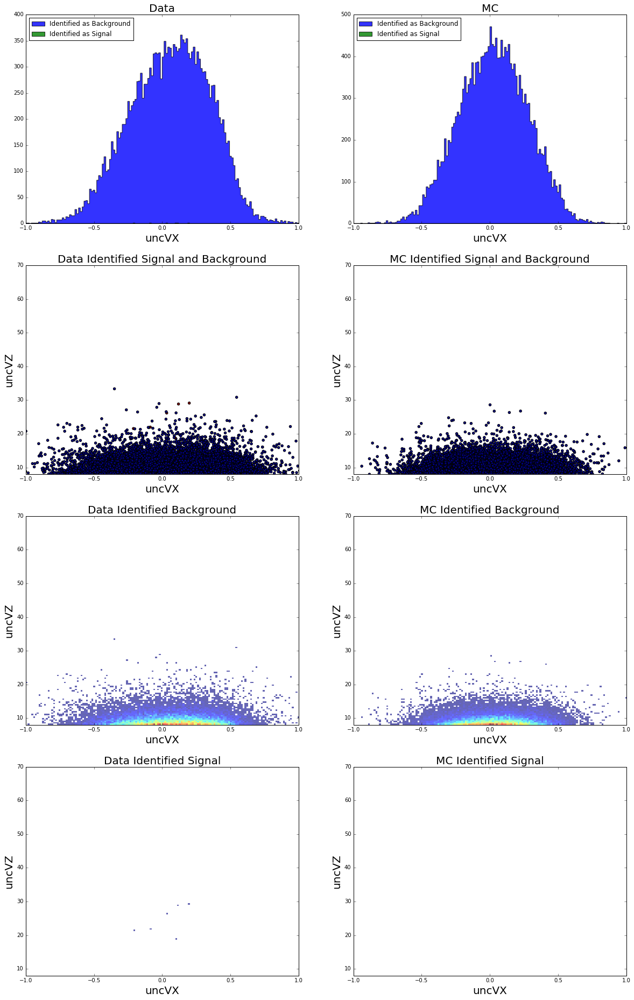

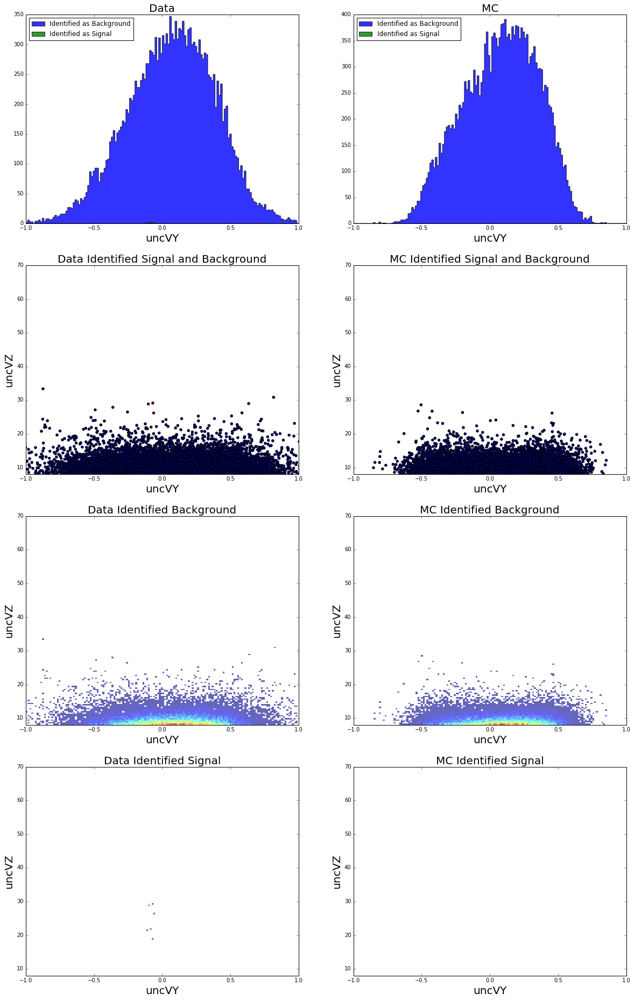

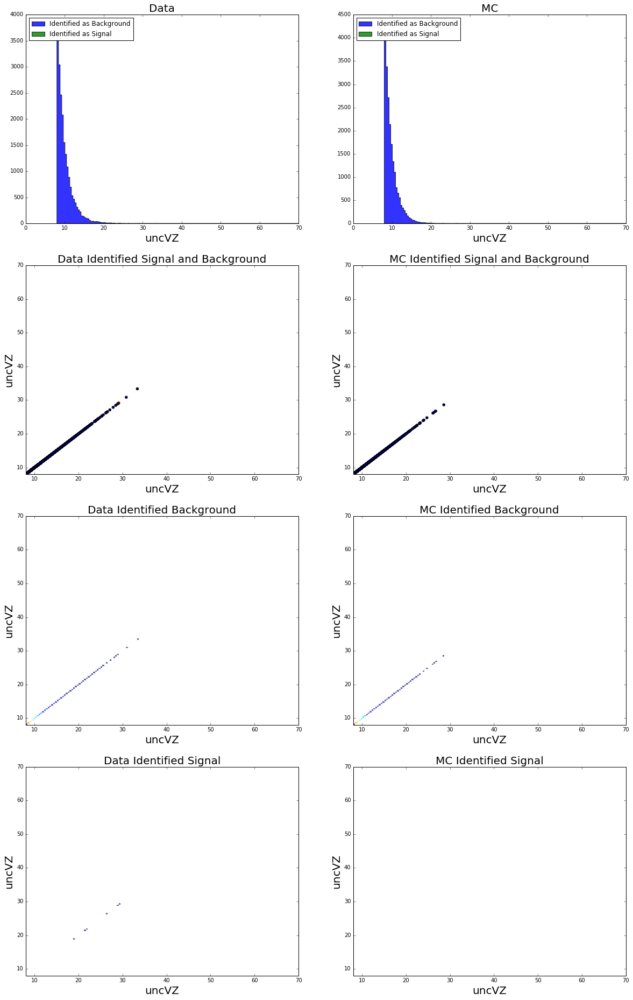

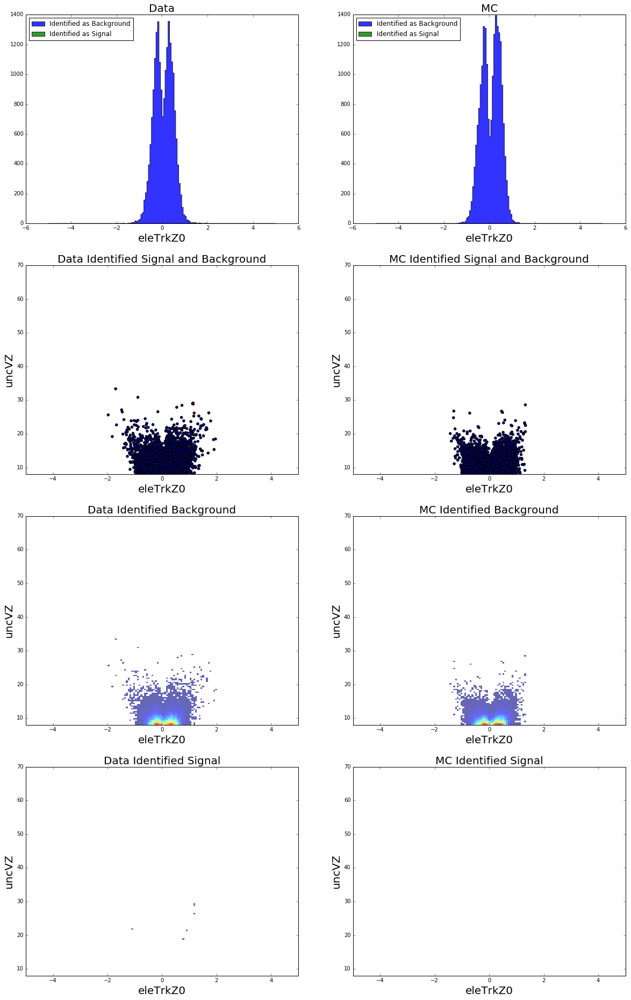

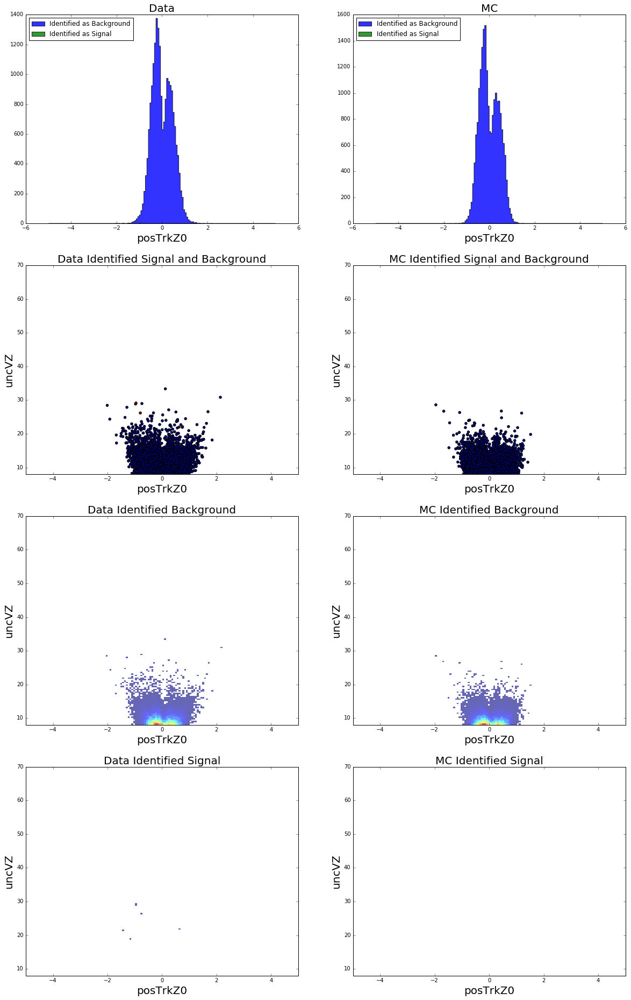

...

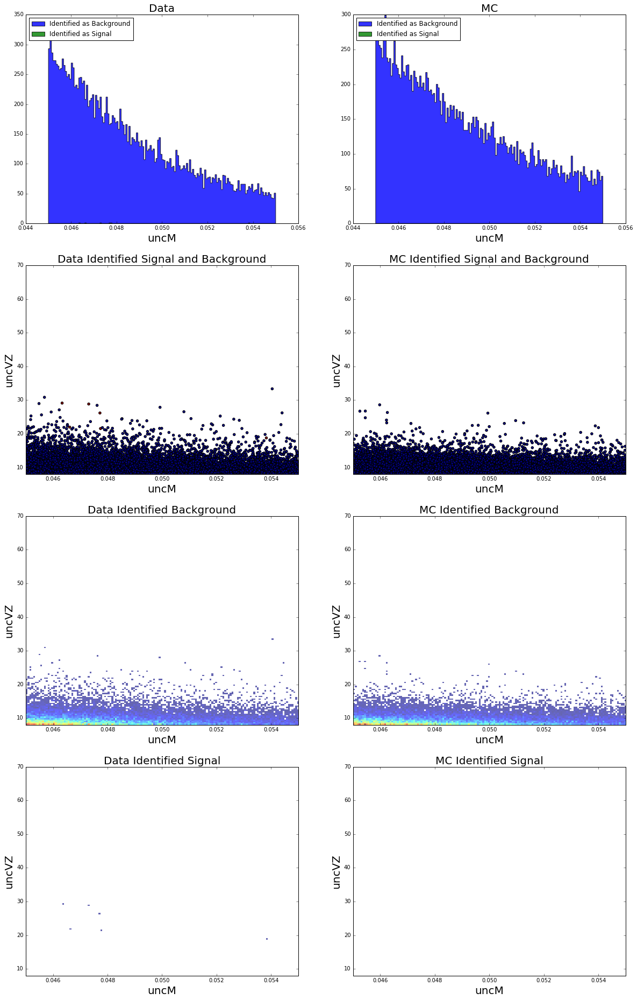

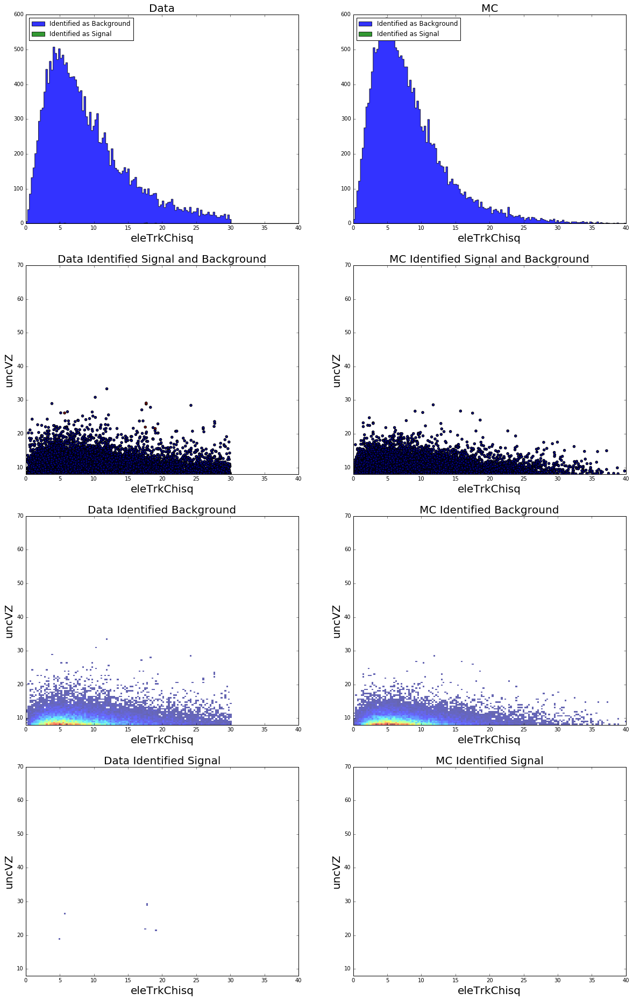

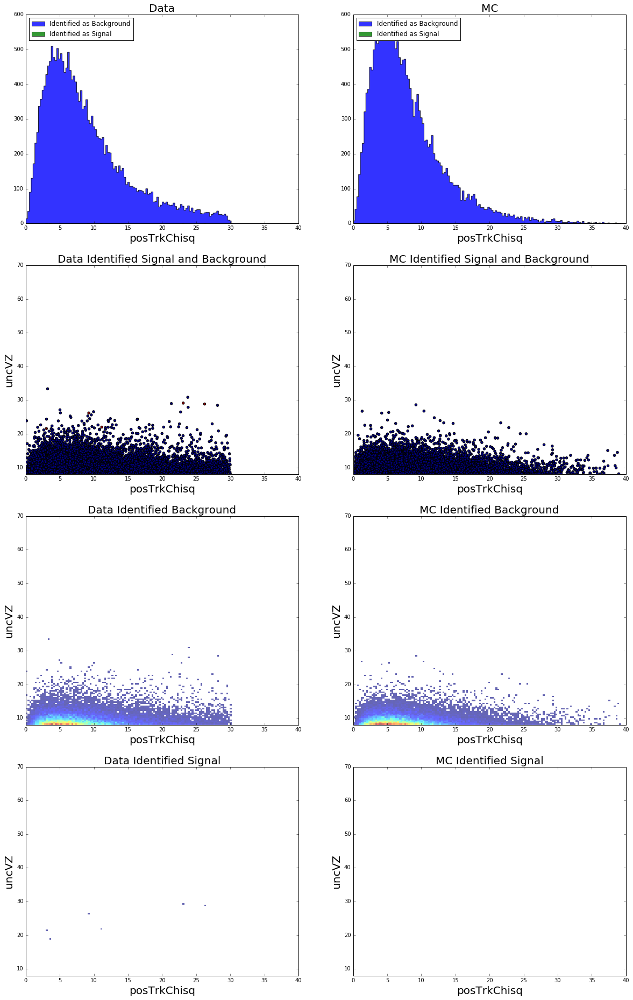

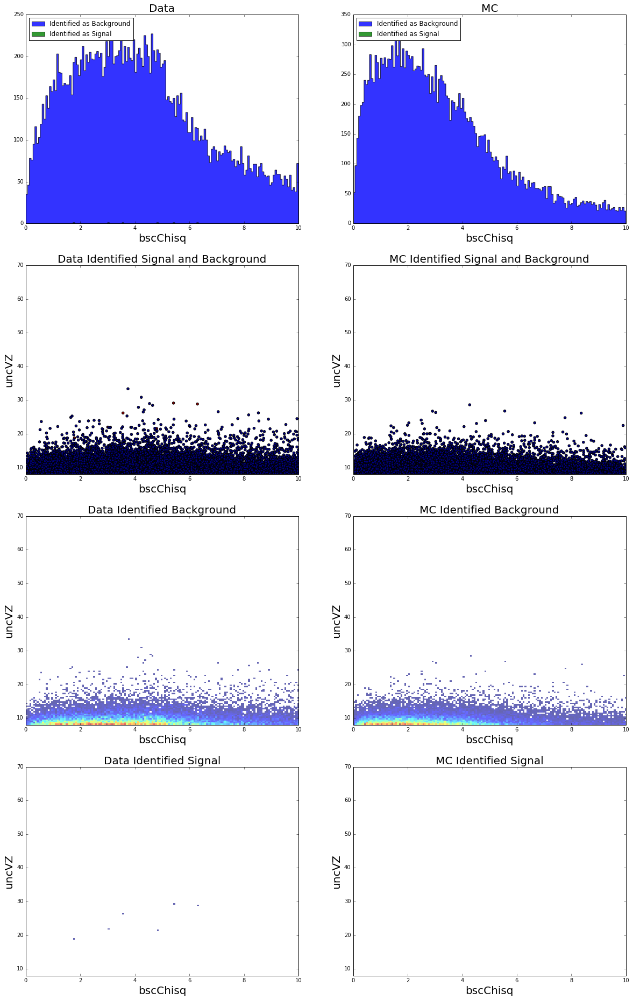

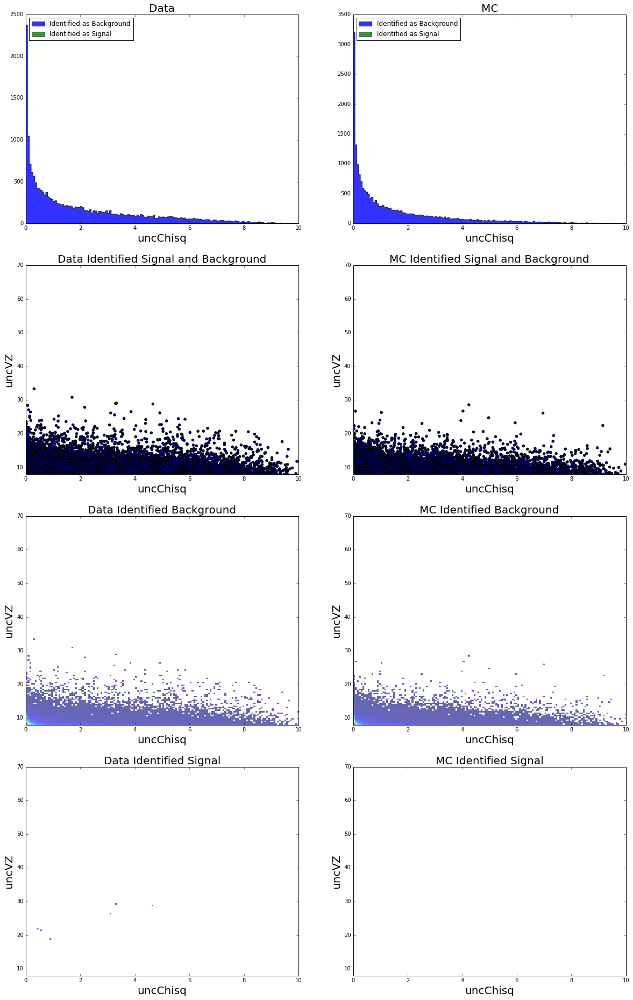

In [20]:
i = 0
for name in param_list:
    fig, ((ax0, ax1),(ax2, ax3),(ax4, ax5),(ax6, ax7)) = plt.subplots(nrows=4, ncols=2, figsize=(20,32))
    ax0.hist(X_data[:, i][y_predictions_proba_data[:,1] < mlp_cut], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Identified as Background")
    ax0.hist(X_data[:, i][y_predictions_proba_data[:,1] > mlp_cut], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Identified as Signal")
    
    ax1.hist(X_mc[:, i][y_predictions_proba_mc[:,1] < mlp_cut], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Identified as Background")
    ax1.hist(X_mc[:, i][y_predictions_proba_mc[:,1] > mlp_cut], bins=150, alpha=0.8, range=(param_min[i], param_max[i]), histtype="stepfilled", label="Identified as Signal")
    
    ax0.set_title("Data", fontsize=20)
    ax0.set_xlabel(name, fontsize=20)
    ax0.legend(loc=2)
    
    ax1.set_title("MC", fontsize=20)
    ax1.set_xlabel(name, fontsize=20)
    ax1.legend(loc=2)
    
    ax2.scatter(X_data[:, i], X_data[:, uncVZi], c=y_predictions_proba_data[:,1] > mlp_cut,label = name)
    ax3.scatter(X_mc[:, i], X_mc[:, uncVZi], c=y_predictions_proba_mc[:,1] > mlp_cut,label = name)
    
    ax2.set_title('Data Identified Signal and Background', fontsize=20)
    ax2.set_xlabel(name, fontsize=20)
    ax2.set_ylabel('uncVZ', fontsize=20)
    ax2.set_xlim(param_min[i], param_max[i])
    ax2.set_ylim(param_min[uncVZi], param_max[uncVZi])
    
    ax3.set_title('MC Identified Signal and Background', fontsize=20)
    ax3.set_xlabel(name, fontsize=20)
    ax3.set_ylabel('uncVZ', fontsize=20)
    ax3.set_xlim(param_min[i], param_max[i])
    ax3.set_ylim(param_min[uncVZi], param_max[uncVZi])
    
    ax4.hist2d(X_data[:, i][y_predictions_proba_data[:,1] < mlp_cut], X_data[:, uncVZi][y_predictions_proba_data[:,1] < mlp_cut], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Identified as Background", cmin=0.5)
    ax5.hist2d(X_mc[:, i][y_predictions_proba_mc[:,1] < mlp_cut], X_mc[:, uncVZi][y_predictions_proba_mc[:,1] < mlp_cut], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Identified as Background", cmin=0.5)
    
    ax6.hist2d(X_data[:, i][y_predictions_proba_data[:,1] > mlp_cut], X_data[:, uncVZi][y_predictions_proba_data[:,1] > mlp_cut], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Identified as Signal", cmin=0.5)
    ax7.hist2d(X_mc[:, i][y_predictions_proba_mc[:,1] > mlp_cut], X_mc[:, uncVZi][y_predictions_proba_mc[:,1] > mlp_cut], range=[[param_min[i], param_max[i]],[param_min[uncVZi], param_max[uncVZi]]], bins=150, alpha=0.6, label="Identified as Signal", cmin=0.5)
    
    ax4.set_title('Data Identified Background', fontsize=20)
    ax4.set_xlabel(name, fontsize=20)
    ax4.set_ylabel('uncVZ', fontsize=20)
    ax5.set_title('MC Identified Background', fontsize=20)
    ax5.set_xlabel(name, fontsize=20)
    ax5.set_ylabel('uncVZ', fontsize=20)
    
    ax6.set_title('Data Identified Signal', fontsize=20)
    ax6.set_xlabel(name, fontsize=20)
    ax6.set_ylabel('uncVZ', fontsize=20)
    
    ax7.set_title('MC Identified Signal', fontsize=20)
    ax7.set_xlabel(name, fontsize=20)
    ax7.set_ylabel('uncVZ', fontsize=20)
    
    i = i + 1